In [ ]:
pip install matplotlib


You should consider upgrading via the '/usr/local/bin/python -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [ ]:
# import packages
import pandas as pd
import numpy as np
import matplotlib as plt
import matplotlib.pyplot as plt
import seaborn as sns

import folium
from folium import Marker, GeoJson
from folium.plugins import MarkerCluster, HeatMap

from datetime import datetime
import os


## Data Wrangling & Preprocessing

### Load Dataset

In [ ]:
# import dataset from packages
df = pd.read_csv('/work/PetaBencana.csv')

# Show 5 random samples
df.sample(5)

In [ ]:
#Terdapat variabel yang masih mengandung format json pada data frame,
#sehingga membingungkan proses pengolahan data, 
#maka kami mengonversi format json tersebut menjadi data frame,
#metode parsing yang digunakan adalah power query melalui excel

df_new = pd.read_csv('/work/PetaBencana_Convert.csv')
df_new.head()

In [ ]:
pb = pd.read_csv('/work/Puskesmas Bekasi.csv')
pb

In [ ]:
pj = pd.read_csv('/work/Puskesmas Jakarta.csv')
pj

### Explore Data 

In [ ]:
#Melihat pengaruh parsing dari kolom report_dat dan tags
display(df.shape) #ada 4235 baris dan 22 kolom
display(df_new.shape) #Bertambah satu baris dan 5 kolom yakni menjadi 4236 baris 27 kolom

(4235, 22)

(4236, 27)

In [ ]:
display(df.columns)
display(df_new.columns) 
#terdapat penambahan pada kolom report_type, flood_depth,  
#local_area_id, dan instance_region_code, points, district_id,

Index(['pkey', 'date', 'time', 'source', 'status', 'url', 'image_url',
       'disaster_type', 'report_dat', 'tags', 'title', 'text', 'ID_Desa',
       'ID_Kec', 'ID_Kab', 'ID_Prov', 'Desa', 'Kecamatan', 'Kabupaten',
       'Provinsi', 'long', 'lat'],
      dtype='object')

Index(['pkey', 'date', 'time', 'source', 'status', 'url', 'image_url',
       'disaster_type', 'report_type', 'flood_depth', 'points', 'district_id',
       'local_area_id', 'instance_region_code', 'title', 'text', 'ID_Desa',
       'ID_Kec', 'ID_Kab', 'ID_Prov', 'Desa', 'Kecamatan', 'Kabupaten',
       'Provinsi', 'long', 'lat', 'Unnamed: 26'],
      dtype='object')

In [ ]:
df_new.info() 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4236 entries, 0 to 4235
Data columns (total 27 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   pkey                  4235 non-null   float64
 1   date                  4235 non-null   object 
 2   time                  4235 non-null   object 
 3   source                4235 non-null   object 
 4   status                4235 non-null   object 
 5   url                   3570 non-null   object 
 6   image_url             3334 non-null   object 
 7   disaster_type         4235 non-null   object 
 8   report_type           3382 non-null   object 
 9   flood_depth           3155 non-null   float64
 10  points                792 non-null    float64
 11  district_id           2316 non-null   float64
 12  local_area_id         2369 non-null   float64
 13  instance_region_code  4213 non-null   object 
 14  title                 188 non-null    object 
 15  text                 

In [ ]:
#Mengetahui jumlah tipe tiap data
pd.value_counts(df_new.dtypes)
#ditemukan hanya ada dua tipe data yakni objek sebanyak 15 dan float 12

object     15
float64    12
dtype: int64

### Missing value

In [ ]:
#data new
new_missing_value = df_new.isnull()
new_missing_value.head() 
#Melihat secara sekilas bagaimana missing value pada dataframe

,pkey,date,time,source,status,url,image_url,disaster_type,report_type,flood_depth,...,ID_Kec,ID_Kab,ID_Prov,Desa,Kecamatan,Kabupaten,Provinsi,long,lat,Unnamed: 26
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,True
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,True
2,False,False,False,False,False,False,True,False,False,False,...,False,False,False,False,False,False,False,False,False,True
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,True
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,True


In [ ]:
# Count missing value in each column Peta Bencana
null_columns = df_new.isnull().sum().sort_values(ascending=False)
null_columns

Unnamed: 26             4236
title                   4048
points                  3444
district_id             1920
local_area_id           1867
flood_depth             1081
image_url                902
report_type              854
url                      666
text                     406
instance_region_code      23
ID_Desa                    9
ID_Kec                     9
ID_Kab                     9
ID_Prov                    9
Desa                       9
Kecamatan                  9
Kabupaten                  8
Provinsi                   8
disaster_type              1
status                     1
date                       1
source                     1
time                       1
long                       1
lat                        1
pkey                       1
dtype: int64

In [ ]:
# Count missing value in each column Puskesmas Jakarta
null_columns1 = pj.isnull().sum().sort_values(ascending=False)
null_columns1

alamat_puskesmas    1030
nama_puskesmas      1023
Kabupaten              1
dtype: int64

In [ ]:
# Count missing value in each column Peta Bencana
null_columns2 = pb.isnull().sum().sort_values(ascending=False)
null_columns2

KONDISI KURANG BAIK      49
KETERANGAN               43
KONDISI BAIK             19
ALAMAT                   11
NO                        0
KECAMATAN                 0
PUSKESMAS / KELURAHAN     0
dtype: int64

In [ ]:
# Replace nan with 0 and -
df_new['points'] = df_new['points'].fillna(0)
df_new['ID_Desa'] = df_new['ID_Kec'].fillna(0)
df_new['ID_Kec'] = df_new['ID_Kec'].fillna(0)
df_new['ID_Kab'] = df_new['ID_Kab'].fillna(0)
df_new['ID_Prov'] = df_new['ID_Prov'].fillna(0)
df_new['long'] = df_new['long'].fillna(0)
df_new['lat'] = df_new['lat'].fillna(0)
df_new['flood_depth'] = df_new['flood_depth'].fillna(0)
df_new['district_id'] = df_new['district_id'].fillna(0)
df_new['local_area_id'] = df_new['local_area_id'].fillna(0)
df_new['source'] = df_new['source'].fillna('-')
df_new['status'] = df_new['status'].fillna('-')
df_new['url'] = df_new['url'].fillna('-')
df_new['image_url'] = df_new['image_url'].fillna('-')
df_new['disaster_type'] = df_new['disaster_type'].fillna('-')
df_new['report_type'] = df_new['report_type'].fillna('-')
df_new['instance_region_code'] = df_new['instance_region_code'].fillna('-')
df_new['text'] = df_new['text'].fillna('-')
df_new['Desa'] = df_new['Desa'].fillna('-')
df_new['Kecamatan'] = df_new['Kecamatan'].fillna('-')
df_new['Kabupaten'] = df_new['Kabupaten'].fillna('-')
df_new['Provinsi'] = df_new['Provinsi'].fillna('-')
df_new

,pkey,date,time,source,status,url,image_url,disaster_type,report_type,flood_depth,...,ID_Kec,ID_Kab,ID_Prov,Desa,Kecamatan,Kabupaten,Provinsi,long,lat,Unnamed: 26
0,94941.0,01/01/2020,00:03:02,grasp,confirmed,2042596d-b551-4ef2-803d-1ee964cf2278,https://images.petabencana.id/2042596d-b551-4e...,flood,flood,30.0,...,3174020.0,3174.0,31.0,Duri Kepa,Kebon Jeruk,Jakarta Barat,Daerah Khusus Ibukota Jakarta,106.768660,-6.169780,NaN
1,95061.0,01/01/2020,00:43:02,grasp,confirmed,5a0ad45f-7020-43b7-882f-672487ebc6d8,https://images.petabencana.id/5a0ad45f-7020-43...,flood,flood,80.0,...,3275061.0,3275.0,32.0,Pejuang,Medan Satria,Bekasi,Jawa Barat,106.978700,-6.179440,NaN
2,95062.0,01/01/2020,01:14:53,grasp,confirmed,e065b40d-2084-48d6-b42f-1f98cb33e4cc,-,flood,flood,51.0,...,3172060.0,3172.0,31.0,Cipinang Muara,Jatinegara,Jakarta Timur,Daerah Khusus Ibukota Jakarta,106.891000,-6.234490,NaN
3,95063.0,01/01/2020,01:15:08,grasp,confirmed,7cb26903-b1c8-4be7-8b81-7014c8a83fbd,https://images.petabencana.id/7cb26903-b1c8-4b...,flood,flood,100.0,...,3216061.0,3216.0,32.0,Mekarmukti,Cikarang Utara,Bekasi,Jawa Barat,107.161890,-6.301700,NaN
4,95064.0,01/01/2020,01:18:03,grasp,confirmed,570d2cb8-d5b6-404f-86ef-8a2a0d27f391,https://images.petabencana.id/570d2cb8-d5b6-40...,flood,flood,15.0,...,3173060.0,3173.0,31.0,Cempaka Baru,Kemayoran,Jakarta Pusat,Daerah Khusus Ibukota Jakarta,106.860920,-6.168590,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4231,299723.0,28/12/2021,08:00:14,grasp,confirmed,d1bcdbc7-1819-41aa-b5fe-34d0162bb084,-,flood,flood,54.0,...,3173070.0,3173.0,31.0,Karang Anyar,Sawah Besar,Jakarta Pusat,Daerah Khusus Ibukota Jakarta,106.827622,-6.157398,NaN
4232,299724.0,28/12/2021,10:49:49,grasp,confirmed,ee548663-23ad-4adb-8d85-f8c64b1fbb6c,https://images.petabencana.id/ee548663-23ad-4a...,flood,flood,19.0,...,3207111.0,3207.0,32.0,Purwajaya,Purwadadi,Ciamis,Jawa Barat,108.695570,-7.460077,NaN
4233,299726.0,29/12/2021,07:22:30,detik,confirmed,https://pasangmata.detik.com/contribution/363227,https://akcdn.detik.net.id/community/pasma/202...,flood,-,0.0,...,3172040.0,3172.0,31.0,Cipinang Melayu,Makasar,Jakarta Timur,Daerah Khusus Ibukota Jakarta,106.916313,-6.251612,NaN
4234,299728.0,30/12/2021,09:32:42,grasp,confirmed,14171753-a6db-40e7-8acf-31dec5dff2d6,https://images.petabencana.id/14171753-a6db-40...,flood,flood,22.0,...,5102040.0,5102.0,51.0,Banjar Anyar,Kediri,Tabanan,Bali,115.142300,-8.554095,NaN


In [ ]:
pj['Kabupaten'] = pj['Kabupaten'].fillna('-')
pj['nama_puskesmas'] = pj['nama_puskesmas'].fillna('-')
pj['alamat_puskesmas'] = pj['alamat_puskesmas'].fillna('-')
pj

,Kabupaten,nama_puskesmas,alamat_puskesmas
0,Jakarta Pusat,PKC Cempaka Putih,Jalan Pramuka Sari I RT.14 RW.8 Jakarta Pusat
1,Jakarta Pusat,PKL Cempaka Putih Barat 2,Jl.Cempaka Putih Barat XIX no 2 rt 07 rw 07
2,Jakarta Pusat,PKL Cempaka Putih Timur,Jl Cempaka Putih Tengah XIV no 10 Rt 2/05
3,"Jakarta Pusat,PKL Rawasari,""JL. PRAMUKA SARI 1...",-,-
4,Jakarta Pusat,PKC Gambir,JALAN CIDENG TIMUR 1 NO.13-15
...,...,...,...
1903,"Kepulauan Seribu,PKL Pulau Harapan,""Kelurahan ...",-,-
1904,Kepulauan Seribu,PKC Kep Seribu Selatan,Jalan Pantai Selatan Pulau Tidung
1905,Kepulauan Seribu,PKL Pari,Pulau Lancang Rt.03/ Rw.03
1906,"Kepulauan Seribu,PKL Untung Jawa,""Pulau Untung...",-,-


In [ ]:
# Convert dataframe
df_new['date'] = df_new['date'].astype('datetime64[ns]')
df_new['source'] = df_new['source'].astype('category')
df_new['status'] = df_new['status'].astype('category')
df_new['report_type'] = df_new['report_type'].astype('category')
df_new['disaster_tyoe'] = df_new['disaster_type'].astype('category')
df_new['instance_region_code'] = df_new['instance_region_code'].astype('category')
df_new.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4236 entries, 0 to 4235
Data columns (total 28 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   pkey                  4235 non-null   float64       
 1   date                  4235 non-null   datetime64[ns]
 2   time                  4235 non-null   object        
 3   source                4236 non-null   category      
 4   status                4236 non-null   category      
 5   url                   4236 non-null   object        
 6   image_url             4236 non-null   object        
 7   disaster_type         4236 non-null   object        
 8   report_type           4236 non-null   category      
 9   flood_depth           4236 non-null   float64       
 10  points                4236 non-null   float64       
 11  district_id           4236 non-null   float64       
 12  local_area_id         4236 non-null   float64       
 13  instance_region_co

In [ ]:
pb['KONDISI KURANG BAIK'] = pb['KONDISI KURANG BAIK'].fillna('-')
pb['KONDISI BAIK'] = pb['KONDISI BAIK'].fillna('-')
pb['ALAMAT'] = pb['ALAMAT'].fillna('-')
pb

,NO,KECAMATAN,PUSKESMAS / KELURAHAN,ALAMAT,KONDISI BAIK,KONDISI KURANG BAIK,KETERANGAN
0,1,BANTARGEBANG,BANTAR GEBANG,Jl. Raya Narogong Km 11 Rt.001 Rw 008 Kel. Ban...,√,-,NaN
1,2,BANTARGEBANG,CIKETING UDIK,"Jl. Ciketing Udik, RT.001/RW.003, Ciketing Udi...",√,-,NaN
2,3,BANTARGEBANG,SUMUR BATU,Jl. Raya Sumur Batu - Pangkalan 2 No.1 Kel. Su...,√,-,NaN
3,4,BANTARGEBANG,CIKIWUL,-,-,-,akan dibangun tahun 2021
4,5,BEKASI BARAT,BINTARA,"Jl. Bintara VIII No. 89, Kec. Bekasi Barat",-,√,NaN
5,6,BEKASI BARAT,BINTARA JAYA,"Jl. Tambora No. 1, Kec. Bekasi Barat",√,-,NaN
6,7,BEKASI BARAT,JAKASAMPURNA,-,-,-,belum ada gedung
7,8,BEKASI BARAT,KOTA BARU,Jl. Melinjo Perum Harapan Baru Kec. Bekasi Barat,√,-,NaN
8,9,BEKASI BARAT,KRANJI,"Jl. Sakura Perum Duta Kranji, Kec. Bekasi Barat",√,-,NaN
9,10,BEKASI SELATAN,JAKA MULYA,Jl. Surya Merdeka No. 1 Perum Pondok Surya Md ...,-,√,NaN


In [ ]:
# drop nan value
df_news = df_new.drop(columns=['title','time','pkey','Unnamed: 26'])
df_news

,date,source,status,url,image_url,disaster_type,report_type,flood_depth,points,district_id,...,ID_Kec,ID_Kab,ID_Prov,Desa,Kecamatan,Kabupaten,Provinsi,long,lat,disaster_tyoe
0,2020-01-01,grasp,confirmed,2042596d-b551-4ef2-803d-1ee964cf2278,https://images.petabencana.id/2042596d-b551-4e...,flood,flood,30.0,0.0,3174.0,...,3174020.0,3174.0,31.0,Duri Kepa,Kebon Jeruk,Jakarta Barat,Daerah Khusus Ibukota Jakarta,106.768660,-6.169780,flood
1,2020-01-01,grasp,confirmed,5a0ad45f-7020-43b7-882f-672487ebc6d8,https://images.petabencana.id/5a0ad45f-7020-43...,flood,flood,80.0,1.0,0.0,...,3275061.0,3275.0,32.0,Pejuang,Medan Satria,Bekasi,Jawa Barat,106.978700,-6.179440,flood
2,2020-01-01,grasp,confirmed,e065b40d-2084-48d6-b42f-1f98cb33e4cc,-,flood,flood,51.0,1.0,3172.0,...,3172060.0,3172.0,31.0,Cipinang Muara,Jatinegara,Jakarta Timur,Daerah Khusus Ibukota Jakarta,106.891000,-6.234490,flood
3,2020-01-01,grasp,confirmed,7cb26903-b1c8-4be7-8b81-7014c8a83fbd,https://images.petabencana.id/7cb26903-b1c8-4b...,flood,flood,100.0,2.0,0.0,...,3216061.0,3216.0,32.0,Mekarmukti,Cikarang Utara,Bekasi,Jawa Barat,107.161890,-6.301700,flood
4,2020-01-01,grasp,confirmed,570d2cb8-d5b6-404f-86ef-8a2a0d27f391,https://images.petabencana.id/570d2cb8-d5b6-40...,flood,flood,15.0,1.0,3173.0,...,3173060.0,3173.0,31.0,Cempaka Baru,Kemayoran,Jakarta Pusat,Daerah Khusus Ibukota Jakarta,106.860920,-6.168590,flood
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4231,2021-12-28,grasp,confirmed,d1bcdbc7-1819-41aa-b5fe-34d0162bb084,-,flood,flood,54.0,0.0,3173.0,...,3173070.0,3173.0,31.0,Karang Anyar,Sawah Besar,Jakarta Pusat,Daerah Khusus Ibukota Jakarta,106.827622,-6.157398,flood
4232,2021-12-28,grasp,confirmed,ee548663-23ad-4adb-8d85-f8c64b1fbb6c,https://images.petabencana.id/ee548663-23ad-4a...,flood,flood,19.0,0.0,0.0,...,3207111.0,3207.0,32.0,Purwajaya,Purwadadi,Ciamis,Jawa Barat,108.695570,-7.460077,flood
4233,2021-12-29,detik,confirmed,https://pasangmata.detik.com/contribution/363227,https://akcdn.detik.net.id/community/pasma/202...,flood,-,0.0,0.0,3172.0,...,3172040.0,3172.0,31.0,Cipinang Melayu,Makasar,Jakarta Timur,Daerah Khusus Ibukota Jakarta,106.916313,-6.251612,flood
4234,2021-12-30,grasp,confirmed,14171753-a6db-40e7-8acf-31dec5dff2d6,https://images.petabencana.id/14171753-a6db-40...,flood,flood,22.0,0.0,0.0,...,5102040.0,5102.0,51.0,Banjar Anyar,Kediri,Tabanan,Bali,115.142300,-8.554095,flood


In [ ]:
pb_new = pb.drop(columns=['KETERANGAN'])
pb_new

,NO,KECAMATAN,PUSKESMAS / KELURAHAN,ALAMAT,KONDISI BAIK,KONDISI KURANG BAIK
0,1,BANTARGEBANG,BANTAR GEBANG,Jl. Raya Narogong Km 11 Rt.001 Rw 008 Kel. Ban...,√,-
1,2,BANTARGEBANG,CIKETING UDIK,"Jl. Ciketing Udik, RT.001/RW.003, Ciketing Udi...",√,-
2,3,BANTARGEBANG,SUMUR BATU,Jl. Raya Sumur Batu - Pangkalan 2 No.1 Kel. Su...,√,-
3,4,BANTARGEBANG,CIKIWUL,-,-,-
4,5,BEKASI BARAT,BINTARA,"Jl. Bintara VIII No. 89, Kec. Bekasi Barat",-,√
5,6,BEKASI BARAT,BINTARA JAYA,"Jl. Tambora No. 1, Kec. Bekasi Barat",√,-
6,7,BEKASI BARAT,JAKASAMPURNA,-,-,-
7,8,BEKASI BARAT,KOTA BARU,Jl. Melinjo Perum Harapan Baru Kec. Bekasi Barat,√,-
8,9,BEKASI BARAT,KRANJI,"Jl. Sakura Perum Duta Kranji, Kec. Bekasi Barat",√,-
9,10,BEKASI SELATAN,JAKA MULYA,Jl. Surya Merdeka No. 1 Perum Pondok Surya Md ...,-,√


In [ ]:
#Menghitung data yang duplicate pada data yang baru
pd.value_counts(df_news.duplicated()).dropna() #ada 8 data yang duplicate

False    4228
True        8
dtype: int64

In [ ]:
#cek missing value
df_news.isnull().sum()

date                    1
source                  0
status                  0
url                     0
image_url               0
disaster_type           0
report_type             0
flood_depth             0
points                  0
district_id             0
local_area_id           0
instance_region_code    0
text                    0
ID_Desa                 0
ID_Kec                  0
ID_Kab                  0
ID_Prov                 0
Desa                    0
Kecamatan               0
Kabupaten               0
Provinsi                0
long                    0
lat                     0
disaster_tyoe           0
dtype: int64

In [ ]:
#cek mean data points
mean=df_news['points'].mean()
mean


0.1789423984891407

### Conclution

1. Dataset yang digunakan adalah peta bencana, puskesmas di Jakarta, dan puskesmas di Bekasi

undefined.  Terdapat kolom dengan data yang berformat json dan perlu di pharsing 

undefined. Terdapat penambahan kolom pada dataset setelah pharsing sebanyak 5 kolom dan 1 baris

undefined. Terdapat 15 data bertipe objek dan 12 data bertipe float

undefined. Terdapat missing value pada setiap dataset 

undefined. Terdapat 8 data duplikat

undefined. Missing value diganti dengan 0 untuk tipe data integer/float dan '-' untuk tipe data kategori atau objek

undefined. Beberapa kolom yang tidak penting dieliminasi dari dataset

undefined. Konversi atribut bertipe objek menjadi datetime64, integer, dan kategori

undefined. Mean pada kolom points tidak dapat digunakan untuk mereplace missing value

# Exploratory Data Analysis (EDA)

### Structure Investigation

In [ ]:
df_news

,date,source,status,url,image_url,disaster_type,report_type,flood_depth,points,district_id,...,ID_Kec,ID_Kab,ID_Prov,Desa,Kecamatan,Kabupaten,Provinsi,long,lat,disaster_tyoe
0,2020-01-01,grasp,confirmed,2042596d-b551-4ef2-803d-1ee964cf2278,https://images.petabencana.id/2042596d-b551-4e...,flood,flood,30.0,0.0,3174.0,...,3174020.0,3174.0,31.0,Duri Kepa,Kebon Jeruk,Jakarta Barat,Daerah Khusus Ibukota Jakarta,106.768660,-6.169780,flood
1,2020-01-01,grasp,confirmed,5a0ad45f-7020-43b7-882f-672487ebc6d8,https://images.petabencana.id/5a0ad45f-7020-43...,flood,flood,80.0,1.0,0.0,...,3275061.0,3275.0,32.0,Pejuang,Medan Satria,Bekasi,Jawa Barat,106.978700,-6.179440,flood
2,2020-01-01,grasp,confirmed,e065b40d-2084-48d6-b42f-1f98cb33e4cc,-,flood,flood,51.0,1.0,3172.0,...,3172060.0,3172.0,31.0,Cipinang Muara,Jatinegara,Jakarta Timur,Daerah Khusus Ibukota Jakarta,106.891000,-6.234490,flood
3,2020-01-01,grasp,confirmed,7cb26903-b1c8-4be7-8b81-7014c8a83fbd,https://images.petabencana.id/7cb26903-b1c8-4b...,flood,flood,100.0,2.0,0.0,...,3216061.0,3216.0,32.0,Mekarmukti,Cikarang Utara,Bekasi,Jawa Barat,107.161890,-6.301700,flood
4,2020-01-01,grasp,confirmed,570d2cb8-d5b6-404f-86ef-8a2a0d27f391,https://images.petabencana.id/570d2cb8-d5b6-40...,flood,flood,15.0,1.0,3173.0,...,3173060.0,3173.0,31.0,Cempaka Baru,Kemayoran,Jakarta Pusat,Daerah Khusus Ibukota Jakarta,106.860920,-6.168590,flood
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4231,2021-12-28,grasp,confirmed,d1bcdbc7-1819-41aa-b5fe-34d0162bb084,-,flood,flood,54.0,0.0,3173.0,...,3173070.0,3173.0,31.0,Karang Anyar,Sawah Besar,Jakarta Pusat,Daerah Khusus Ibukota Jakarta,106.827622,-6.157398,flood
4232,2021-12-28,grasp,confirmed,ee548663-23ad-4adb-8d85-f8c64b1fbb6c,https://images.petabencana.id/ee548663-23ad-4a...,flood,flood,19.0,0.0,0.0,...,3207111.0,3207.0,32.0,Purwajaya,Purwadadi,Ciamis,Jawa Barat,108.695570,-7.460077,flood
4233,2021-12-29,detik,confirmed,https://pasangmata.detik.com/contribution/363227,https://akcdn.detik.net.id/community/pasma/202...,flood,-,0.0,0.0,3172.0,...,3172040.0,3172.0,31.0,Cipinang Melayu,Makasar,Jakarta Timur,Daerah Khusus Ibukota Jakarta,106.916313,-6.251612,flood
4234,2021-12-30,grasp,confirmed,14171753-a6db-40e7-8acf-31dec5dff2d6,https://images.petabencana.id/14171753-a6db-40...,flood,flood,22.0,0.0,0.0,...,5102040.0,5102.0,51.0,Banjar Anyar,Kediri,Tabanan,Bali,115.142300,-8.554095,flood


In [ ]:
# menampilkan sampel dari dataset
df_news.sample(5)

,date,source,status,url,image_url,disaster_type,report_type,flood_depth,points,district_id,...,ID_Kec,ID_Kab,ID_Prov,Desa,Kecamatan,Kabupaten,Provinsi,long,lat,disaster_tyoe
226,2020-02-01,grasp,confirmed,969a8291-3ab3-43ba-9295-240c201a61d0,-,flood,flood,106.0,0.0,0.0,...,3671020.0,3671.0,36.0,Petir,Cipondoh,Tangerang,Banten,106.713460,-6.186460,flood
1718,2020-02-25,grasp,confirmed,56d91f96-d89c-4f1f-92b2-f526657c0cca,https://images.petabencana.id/56d91f96-d89c-4f...,flood,flood,64.0,0.0,3173.0,...,3173060.0,3173.0,31.0,Sumur Batu,Kemayoran,Jakarta Pusat,Daerah Khusus Ibukota Jakarta,106.870270,-6.161410,flood
1334,2020-02-24,grasp,confirmed,99665f8c-30a5-4688-8aa4-d8fed46daced,https://images.petabencana.id/99665f8c-30a5-46...,flood,flood,27.0,1.0,0.0,...,3275041.0,3275.0,32.0,Sepanjang Jaya,Rawalumbu,Bekasi,Jawa Barat,106.994840,-6.260500,flood
1394,2020-02-24,qlue,confirmed,-,https://lh3.googleusercontent.com/S1P-H2LmZopx...,flood,-,0.0,0.0,3172.0,...,3172070.0,3172.0,31.0,Pondok Kelapa,Duren Sawit,Jakarta Timur,Daerah Khusus Ibukota Jakarta,106.930250,-6.232800,flood
4127,2021-11-24,grasp,confirmed,09941474-16fd-4213-b713-e00a2d0c55a9,https://images.petabencana.id/09941474-16fd-42...,flood,flood,10.0,0.0,0.0,...,3578280.0,3578.0,35.0,Kandangan,Benowo,Surabaya,Jawa Timur,112.652328,-7.253496,flood


In [ ]:
df_news.describe()

,flood_depth,points,district_id,local_area_id,ID_Desa,ID_Kec,ID_Kab,ID_Prov,long,lat
count,4236.000000,4236.000000,4236.000000,4236.000000,4.236000e+03,4.236000e+03,4236.000000,4236.000000,4236.000000,4236.000000
mean,44.492682,0.178942,1734.790368,818.869924,3.553918e+06,3.553918e+06,3553.857885,34.951369,108.246239,-5.809600
std,42.378039,0.668813,1579.718471,985.245307,1.101517e+06,1.101517e+06,1101.518467,11.115472,4.538073,2.139098
min,0.000000,-7.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,-10.205170
25%,0.000000,0.000000,0.000000,0.000000,3.172090e+06,3.172090e+06,3172.000000,31.000000,106.810070,-6.280157
50%,41.000000,0.000000,3171.000000,195.000000,3.175010e+06,3.175010e+06,3175.000000,31.000000,106.884860,-6.207370
75%,62.000000,0.000000,3173.000000,1654.000000,3.306085e+06,3.306085e+06,3306.000000,33.000000,107.164173,-6.158437
max,200.000000,20.000000,3175.000000,7214.000000,9.420020e+06,9.420020e+06,9420.000000,94.000000,140.664020,48.856696


In [ ]:
# Menampilkan 5 data terbawah
df_news.tail(5)

,date,source,status,url,image_url,disaster_type,report_type,flood_depth,points,district_id,...,ID_Kec,ID_Kab,ID_Prov,Desa,Kecamatan,Kabupaten,Provinsi,long,lat,disaster_tyoe
4231,2021-12-28,grasp,confirmed,d1bcdbc7-1819-41aa-b5fe-34d0162bb084,-,flood,flood,54.0,0.0,3173.0,...,3173070.0,3173.0,31.0,Karang Anyar,Sawah Besar,Jakarta Pusat,Daerah Khusus Ibukota Jakarta,106.827622,-6.157398,flood
4232,2021-12-28,grasp,confirmed,ee548663-23ad-4adb-8d85-f8c64b1fbb6c,https://images.petabencana.id/ee548663-23ad-4a...,flood,flood,19.0,0.0,0.0,...,3207111.0,3207.0,32.0,Purwajaya,Purwadadi,Ciamis,Jawa Barat,108.695570,-7.460077,flood
4233,2021-12-29,detik,confirmed,https://pasangmata.detik.com/contribution/363227,https://akcdn.detik.net.id/community/pasma/202...,flood,-,0.0,0.0,3172.0,...,3172040.0,3172.0,31.0,Cipinang Melayu,Makasar,Jakarta Timur,Daerah Khusus Ibukota Jakarta,106.916313,-6.251612,flood
4234,2021-12-30,grasp,confirmed,14171753-a6db-40e7-8acf-31dec5dff2d6,https://images.petabencana.id/14171753-a6db-40...,flood,flood,22.0,0.0,0.0,...,5102040.0,5102.0,51.0,Banjar Anyar,Kediri,Tabanan,Bali,115.142300,-8.554095,flood
4235,NaT,-,-,-,-,-,-,0.0,0.0,0.0,...,0.0,0.0,0.0,-,-,-,-,0.000000,0.000000,-


In [ ]:
# Menampilkan tipe data
df_news.dtypes

date                    datetime64[ns]
source                        category
status                        category
url                             object
image_url                       object
disaster_type                   object
report_type                   category
flood_depth                    float64
points                         float64
district_id                    float64
local_area_id                  float64
instance_region_code          category
text                            object
ID_Desa                        float64
ID_Kec                         float64
ID_Kab                         float64
ID_Prov                        float64
Desa                            object
Kecamatan                       object
Kabupaten                       object
Provinsi                        object
long                           float64
lat                            float64
disaster_tyoe                 category
dtype: object

In [ ]:
# Menampilkan ukuran dari dataset terbaru
df_news.shape

(4236, 24)

In [ ]:
df_news['disaster_type'].unique()

array(['flood', 'earthquake', 'wind', 'fire', 'volcano', 'haze', '-'],
      dtype=object)

In [ ]:
df_news['source'].unique()

['grasp', 'detik', 'qlue', '-']
Categories (4, object): ['grasp', 'detik', 'qlue', '-']

In [ ]:
df_news['source'].value_counts()

grasp    3382
qlue      665
detik     188
-           1
Name: source, dtype: int64

In [ ]:
df_news['points'].unique()

array([ 0.,  1.,  2., -1.,  4., -2.,  8.,  5.,  3., -3.,  6., -7., 20.])

In [ ]:
df_news['status'].unique()

['confirmed', '-']
Categories (2, object): ['confirmed', '-']

In [ ]:
df_news['Provinsi'].unique()

array(['Daerah Khusus Ibukota Jakarta', 'Jawa Barat', 'Banten',
       'Jawa Tengah', 'Jawa Timur', 'Kalimantan Timur',
       'Sumatera Selatan', 'Daerah Istimewa Yogyakarta', 'Lampung',
       'Nusa Tenggara Barat', 'Sumatera Utara', 'Gorontalo',
       'Kalimantan Selatan', 'Sulawesi Selatan',
       'Kepulauan Bangka Belitung', 'Aceh', 'Bali', 'Riau',
       'Kalimantan Barat', 'Bengkulu', 'Sumatera Barat', 'Papua Barat',
       'Kalimantan Tengah', 'Sulawesi Tengah', 'Maluku', 'Sulawesi Barat',
       'Sulawesi Utara', 'Jambi', 'Kepulauan Riau', 'Papua',
       'Sulawesi Tenggara', '-', 'Nusa Tenggara Timur',
       'Kalimantan Utara', 'Maluku Utara'], dtype=object)

In [ ]:
df_news['report_type'].unique()

['flood', '-', 'structure', 'road', 'wind', 'fire', 'volcano', 'haze']
Categories (8, object): ['flood', '-', 'structure', 'road', 'wind', 'fire', 'volcano', 'haze']

In [ ]:
# Count how many times each data type is present in the dataset

pd.value_counts(df_news.dtypes)

float64           10
object             8
category           1
category           1
category           1
datetime64[ns]     1
category           1
category           1
dtype: int64

### Conclution

undefined. Dimensi pada data  terbaru sebanyak 4236 baris dan 24 kolom

undefined. Terdapat atribut bertipe float sebanyak 10, objek 8, kategori 5, dan datetime 1.

undefined. Terdapat 3 sumber data laporan bencana, yaitu grasp, qlue, dan detik.

### Structure of non-numerical features

In [ ]:
# Menampilkan data atribut bertipe non-numerik
df_news.select_dtypes(exclude="number").head()

,date,source,status,url,image_url,disaster_type,report_type,instance_region_code,text,Desa,Kecamatan,Kabupaten,Provinsi,disaster_tyoe
0,2020-01-01,grasp,confirmed,2042596d-b551-4ef2-803d-1ee964cf2278,https://images.petabencana.id/2042596d-b551-4e...,flood,flood,ID-JK,Banjir di daerah taman ratu dan sekitarnya. Pa...,Duri Kepa,Kebon Jeruk,Jakarta Barat,Daerah Khusus Ibukota Jakarta,flood
1,2020-01-01,grasp,confirmed,5a0ad45f-7020-43b7-882f-672487ebc6d8,https://images.petabencana.id/5a0ad45f-7020-43...,flood,flood,ID-JK,Jl. Kemuning Indah\nKota Harapan Indah.\nBekasi,Pejuang,Medan Satria,Bekasi,Jawa Barat,flood
2,2020-01-01,grasp,confirmed,e065b40d-2084-48d6-b42f-1f98cb33e4cc,-,flood,flood,ID-JK,Banjir selutut orang dewasa di jalan ros merah...,Cipinang Muara,Jatinegara,Jakarta Timur,Daerah Khusus Ibukota Jakarta,flood
3,2020-01-01,grasp,confirmed,7cb26903-b1c8-4be7-8b81-7014c8a83fbd,https://images.petabencana.id/7cb26903-b1c8-4b...,flood,flood,ID-JK,"Banjir di daerah kedasih dan sekitarnya, karen...",Mekarmukti,Cikarang Utara,Bekasi,Jawa Barat,flood
4,2020-01-01,grasp,confirmed,570d2cb8-d5b6-404f-86ef-8a2a0d27f391,https://images.petabencana.id/570d2cb8-d5b6-40...,flood,flood,ID-JK,-,Cempaka Baru,Kemayoran,Jakarta Pusat,Daerah Khusus Ibukota Jakarta,flood


### Structure of numerical features

<AxesSubplot:title={'center':'Unique value per features'}>

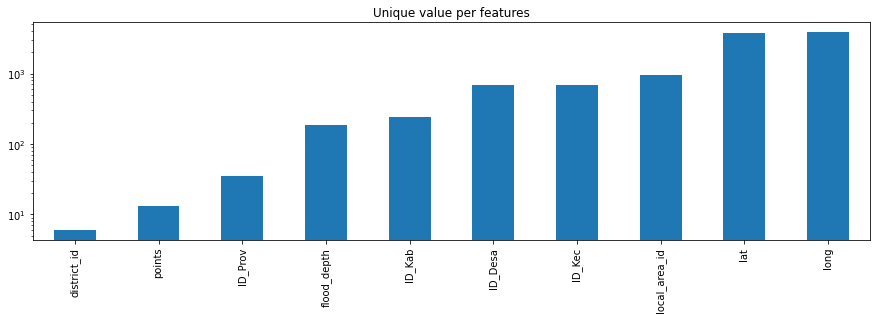

In [ ]:
# untuk setiap atribut bertipe numerik 
unique_val = df_news.select_dtypes(include="number").nunique().sort_values()
unique_val.plot.bar(logy=True, figsize=(15,4), title="Unique value per features")

In [ ]:
# menampilkan presentil setiap atribut bertipe numerik
pct_num_list = [i/10 for i in range(1, 10)]
df_news.describe(include="number", percentiles=pct_num_list).transpose()

,count,mean,std,min,10%,20%,30%,40%,50%,60%,70%,80%,90%,max
flood_depth,4236.0,4.449268e+01,4.237804e+01,0.00000,0.000000e+00,0.000000e+00,1.800000e+01,3.000000e+01,4.100000e+01,4.600000e+01,5.500000e+01,7.200000e+01,1.000000e+02,2.000000e+02
points,4236.0,1.789424e-01,6.688131e-01,-7.00000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,2.000000e+01
district_id,4236.0,1.734790e+03,1.579718e+03,0.00000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,3.171000e+03,3.172000e+03,3.172000e+03,3.174000e+03,3.174000e+03,3.175000e+03
local_area_id,4236.0,8.188699e+02,9.852453e+02,0.00000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.950000e+02,8.170000e+02,1.425000e+03,1.881000e+03,2.379000e+03,7.214000e+03
ID_Desa,4236.0,3.553918e+06,1.101517e+06,0.00000,3.171090e+06,3.172070e+06,3.173040e+06,3.174020e+06,3.175010e+06,3.210190e+06,3.275041e+06,3.515140e+06,5.206025e+06,9.420020e+06
ID_Kec,4236.0,3.553918e+06,1.101517e+06,0.00000,3.171090e+06,3.172070e+06,3.173040e+06,3.174020e+06,3.175010e+06,3.210190e+06,3.275041e+06,3.515140e+06,5.206025e+06,9.420020e+06
ID_Kab,4236.0,3.553858e+03,1.101518e+03,0.00000,3.171000e+03,3.172000e+03,3.173000e+03,3.174000e+03,3.175000e+03,3.210000e+03,3.275000e+03,3.515000e+03,5.206000e+03,9.420000e+03
ID_Prov,4236.0,3.495137e+01,1.111547e+01,0.00000,3.100000e+01,3.100000e+01,3.100000e+01,3.100000e+01,3.100000e+01,3.200000e+01,3.200000e+01,3.500000e+01,5.200000e+01,9.400000e+01
long,4236.0,1.082462e+02,4.538073e+00,0.00000,1.067305e+02,1.067790e+02,1.068254e+02,1.068601e+02,1.068849e+02,1.069229e+02,1.069898e+02,1.093272e+02,1.145892e+02,1.406640e+02
lat,4236.0,-5.809600e+00,2.139098e+00,-10.20517,-6.971125e+00,-6.313380e+00,-6.261980e+00,-6.236250e+00,-6.207370e+00,-6.180430e+00,-6.166485e+00,-6.145970e+00,-3.408619e+00,4.885670e+01


### Content Investigation

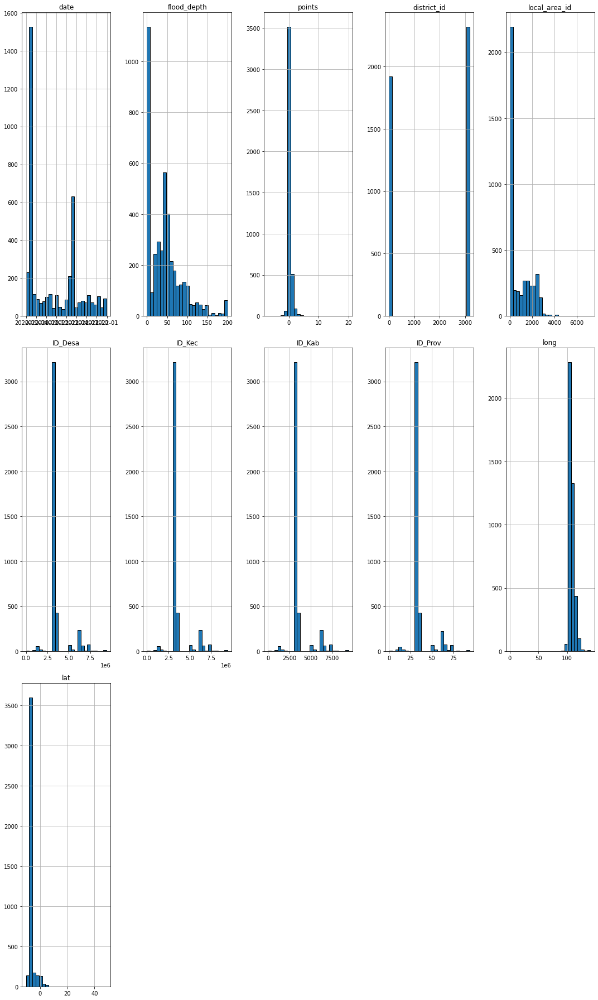

In [ ]:
# ploting histogram untuk setiap atribut bertife numerik
df_news.hist(bins=25, figsize=(15,25), layout=(-1,5), edgecolor='black')
plt.tight_layout()

In [ ]:
# Menampilkan korelasi setiap data numerik 
korelasi = df_news.corr()
korelasi

NameError: name 'df_news' is not defined

<AxesSubplot:>

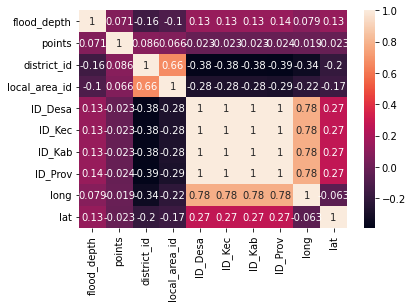

In [ ]:
sns.heatmap(korelasi, annot=True)

In [ ]:
# Memvisualisasikan sebaran benacana yang terjadi di Indonesia
loc_center = [df_news['lat'].mean(), df_news['long'].mean()]

In [ ]:
df_test = df_news[['lat', 'long']]
map1 = folium.Map(location = loc_center, tiles='Openstreetmap', zoom_start = 5, control_scale=True)
for index, loc in df_test.iterrows():
    folium.CircleMarker([loc['lat'], loc['long']], radius=2, weight=5, popup=df_news['disaster_type'][index]).add_to(map1)
folium.LayerControl().add_to(map1)
map1

In [ ]:
# Memvisualisasikan macam-macam bencana yang terjadi di Indonesia
map2 = folium.Map(location = loc_center, tiles='Stamen Terrain', zoom_start = 5, control_scale=True)
df_test = df_news[['lat', 'long','disaster_type']]
for index, loc in df_test.iterrows():
    if loc['disaster_type']=='flood':
        color = 'blue'
    elif loc['disaster_type']=='earthquake':
        color = "yellow"
    elif loc['disaster_type']=='wind':
        color = 'white'
    elif loc['disaster_type']=='volcano':
        color = 'red'
    elif loc['disaster_type']=='fire':
        color = 'orange'
    elif loc['disaster_type']=='haze':
        color = 'purple'
    else:
        color = 'black'
    folium.RegularPolygonMarker([loc['lat'], loc['long']], popup = df_news['disaster_type'][index], fill_color=color, color=False, number_of_sides=3, radius=6, bold=True, rotation=30).add_to(map2)
folium.LayerControl().add_to(map2)
map2

disaster_type
flood         4008
earthquake     131
wind            64
volcano         18
fire            12
haze             2
-                1
dtype: int64


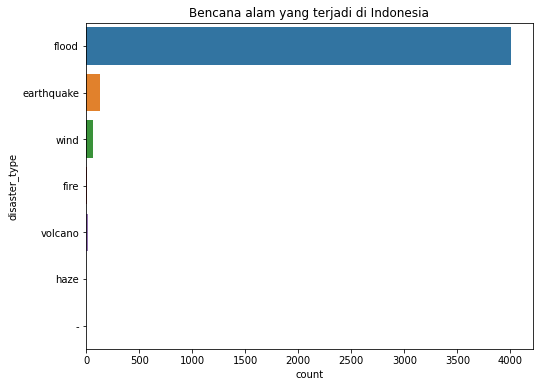

In [ ]:
# Memvisualisasikan bencana alam yang terjadi di Indonesia
print(df_news.value_counts('disaster_type'))#we know that flood is the common disaster that happened in Indonesia based on the data
dffin = df_news['disaster_type'].apply(lambda x : x.split(',')[0])
plt.figure(figsize=(8,6))
sns.countplot(y=dffin)
plt.title('Bencana alam yang terjadi di Indonesia')
plt.show()

In [ ]:
# Menampilkan waktu pelaporan terbanyak saat terjadi bencana di Indonesia
dffin1=df_news.groupby('date')['disaster_type'].value_counts().head()
dffin1
#pada hari yang sama didapatkan pelaporan banjir terbanyak dalam satu hari

date        disaster_type
2020-01-01  flood            100
2020-01-02  flood             10
2020-01-03  flood              9
2020-01-04  flood              1
2020-01-05  flood              2
Name: disaster_type, dtype: int64

Jakarta Barat        22
Bekasi               17
Jakarta Selatan      15
Tangerang Selatan    15
Jakarta Pusat        10
Jakarta Timur         9
Tangerang             6
Depok                 3
Bogor                 2
Jakarta Utara         1
Name: Kabupaten, dtype: int64


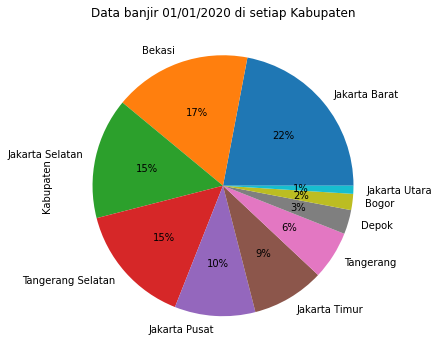

In [ ]:
#Menampilkan dan memvisualisasikan daerah dengan pelaporan terbanyak pada 01/01/2020
dffin2=df_news[(df_news['date']=='2020-01-01') & (df_news['disaster_type']=='flood')]
print(dffin2['Kabupaten'].value_counts())
dffin2['Kabupaten'].value_counts().plot(kind='pie', title='Data banjir 01/01/2020 di setiap Kabupaten', figsize=(8,6), autopct='%1.0f%%')
plt.show()

<AxesSubplot:>

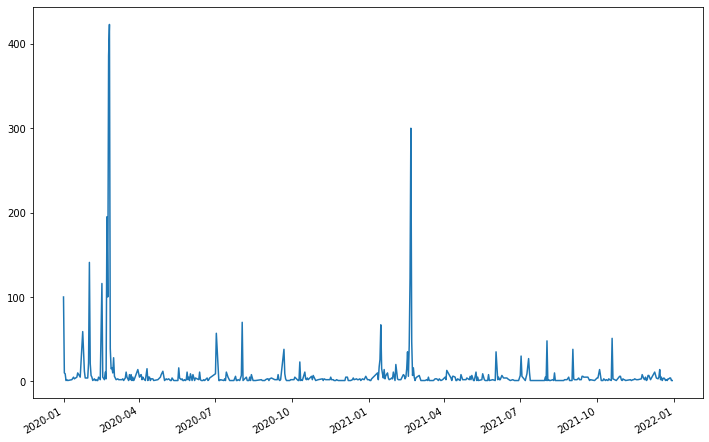

In [ ]:
# Menampilkan waktu terjadinya bencana
df_news['date'].value_counts().plot(kind='line', figsize = (12,8))

In [ ]:
# menampilkan kedalaman banjir yang tertinggi
df_news['flood_depth'].max() 

200.0

In [ ]:
# Menampilkan daerah dengan kedalaman banjir tertinggi
print(df_news[df_news['flood_depth']==200.0].value_counts().sum()) # terdapat 14 daerah dengan kedalaman banjir paling dalam
dffin3=df_news[(df_news['flood_depth']==200.0)&(df_news['Kabupaten'])]
dffin3[['date','Desa','Kecamatan','Kabupaten','disaster_type']].sort_values('Kabupaten') 
#pada data desa gambir terjadi bencana yang sama pada tanggal yang sama di tahun yang berbeda

14


,date,Desa,Kecamatan,Kabupaten,disaster_type
4028,2021-11-24,Kalibagor,Kalibagor,Banyumas,flood
2731,2021-01-16,Barabai Selatan,Barabai,Hulu Sungai Tengah,flood
2524,2020-03-12,Gambir,Gambir,Jakarta Pusat,flood
3664,2021-03-13,Gambir,Gambir,Jakarta Pusat,flood
3279,2021-02-20,Bintaro,Pesanggrahan,Jakarta Selatan,flood
3430,2021-02-20,Petogogan,Kebayoran Baru,Jakarta Selatan,flood
3385,2021-02-20,Halim Perdana Kusumah,Makasar,Jakarta Timur,flood
2237,2020-06-07,Pluit,Penjaringan,Jakarta Utara,flood
2263,2020-07-16,Bone,Masamba,Luwu Utara,flood
2525,2020-04-12,Tanjung Selamat,Medan Tuntungan,Medan,flood


Jakarta Timur      681
Jakarta Barat      527
Bekasi             473
Jakarta Utara      408
Jakarta Selatan    375
Name: Kabupaten, dtype: int64


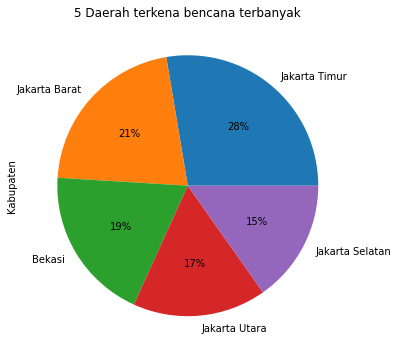

In [ ]:
# Menampilkan 5 daerah yang sangat rawan terkena bencana
dffin4 = df_news['Kabupaten'].value_counts(ascending=False).head(5)
print(dffin4)
dffin4.plot(kind = 'pie', title='5 Daerah terkena bencana terbanyak', figsize=(8,6), autopct='%1.0f%%')
plt.show()

<AxesSubplot:>

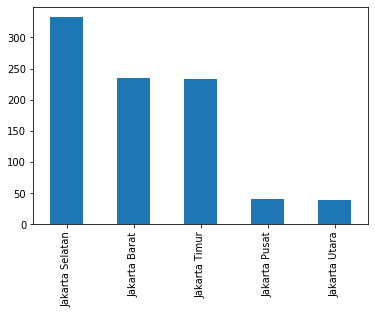

In [ ]:
# Menampilkan sebaran ketersediaan fasilitas kesehatan di Jakarta
pj['Kabupaten'].value_counts().head(5).plot(kind='bar')

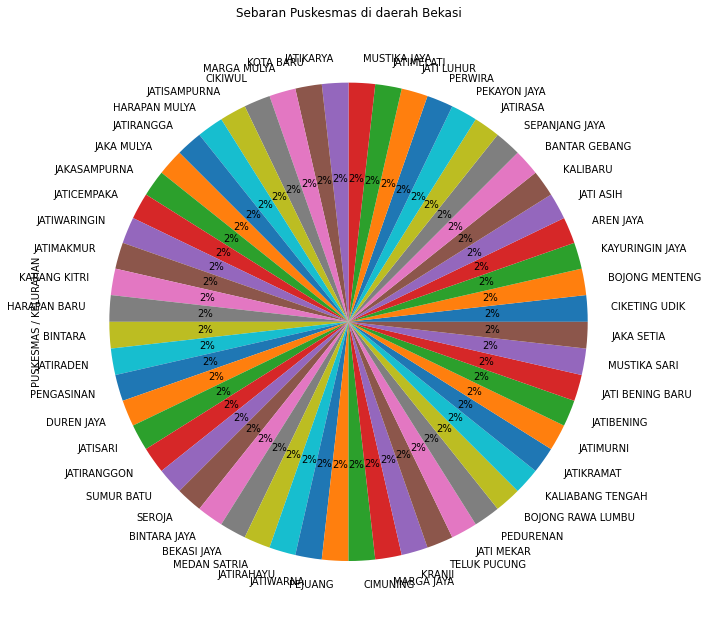

In [ ]:
# Menampilkan ketersediaan fasilitas kesehatan di Bekasi
dffin6 = pb_new['PUSKESMAS / KELURAHAN'].value_counts()
dffin6.plot(kind='pie', title='Sebaran Puskesmas di daerah Bekasi', figsize=(12,11), autopct='%1.0f%%')
plt.show()

### Conclusion

1. Kebanyakan data memiliki korelasi yang sangat rendah.

undefined. Persebaran bencana alam di Indonesia banyak terjadi di Pulau Jawa .

undefined. Bencana alam lebih sering terjadi pada tahun 2020 dibandingkan tahun 2021.

undefined. Banjir merupakan bencana alam dengan frekuensi tertinggi yang terjadi di Indonesia dan hampir terjadi di seluruh wilayah di Indonesia.

undefined. Kedalaman banjir yang paling tinggi adalah setinggi 2 meter yang terjadi di 14 daerah di Indonesia.

undefined. 5 daerah yang paling rentan terkena bencana alam di Indonesia adalah Jakarta Timur, Jakarta Barat, Bekasi, Jakarta Utara, dan Jakarta Selatan. Bencana yang rawan melanda kelima daerah tersebut adalah banjir.

undefined. Ketersediaan fasilitas kesehatan (puskesmas) di 5 daerah paling rawan terkena bencana sudah mencukupi kebutuhan daerah tersebut ketika terjadi bencana berdasarkan perbandingan keterjadian bencana dengan banyaknya puskesmas yang ada. Korban-korban bencana alam akan terevakuasi lebih cepat tanpa khawatir tidak akan mendapatkan fasilitas kesehatan.

In [ ]:
!pip install openpyxl

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 242.1/242.1 KB 20.8 MB/s eta 0:00:00
You should consider upgrading via the '/root/venv/bin/python -m pip install --upgrade pip' command.


In [ ]:
with pd.ExcelWriter("D:\tan45\tan45.xlsx") as writer:
    df_news.to_excel(writer, sheet_name='dataset')

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=4de8ad5b-abe5-458f-afac-9c5cd0964062' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>